# Day 2 Programming Lab

The following exercises will not count towards your course mark, but they provide you with an opportunity to receive feedback on your programming skills in advance of you completing your summative assignments.

The goal of the following exercises is to make you apply the concepts and general methods seen in Day 2 of the Bootcamp and develop Python scripts to perform Computer Vision and Image processing tasks.

## OpenCV
**In the following exercises you will use OpenCV library to read images and conduct image processing**

In [6]:
# The following libraries will let you use opencv
import cv2 #opencv itself
import numpy as np # matrix manipulations

#the following are to do with this interactive notebook code
%matplotlib inline 
from matplotlib import pyplot as plt # this lets you draw inline pictures in the notebooks
import pylab # this allows you to control figure size 
pylab.rcParams['figure.figsize'] = (10.0, 8.0) # this controls figure size in the notebook

#### Download Image: 
Open the image "Day 2_Programming Lab_People.jpg". 
To complete this task you need to download the Day 2_Programming Lab_People.jpg from Canvas, then use cv2.imread() method.

In [7]:
people = cv2.imread("Day 2_Programming Lab_People.jpg")


Print the image size, shape and type

In [8]:
print("Size :", people.size)

print("Shape :", people.shape)

print("Type :", people.dtype)

Size : 749088
Shape : (408, 612, 3)
Type : uint8


Display the image using plt.imshow() method

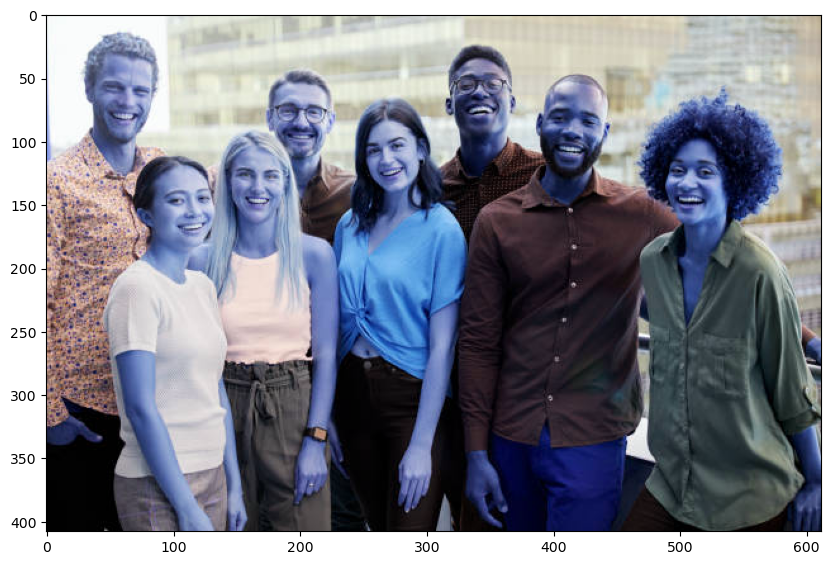

In [9]:
plt.imshow(people)

Do you  notice anything wrong with the image?

In [10]:
# Please provide your solution here
#
#

use the method cv2.split to split the color channels of the image

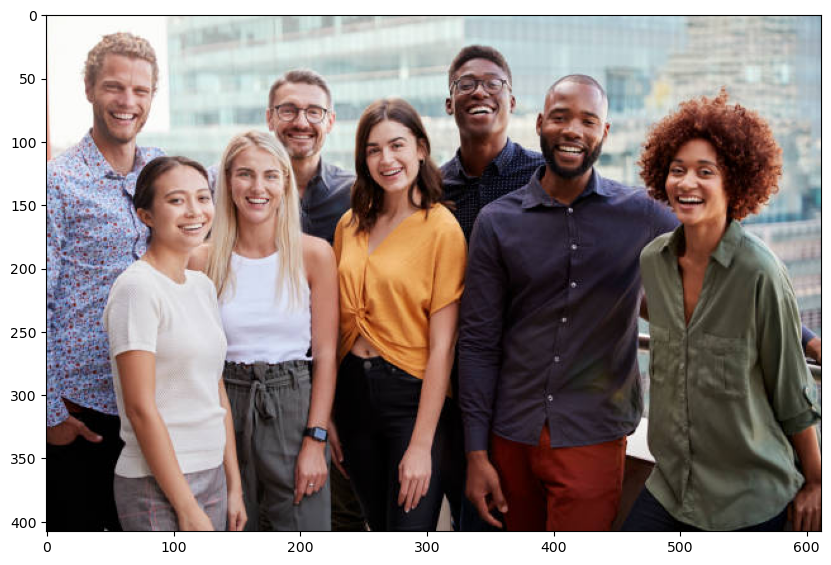

In [11]:
b,g,r = cv2.split(people)
people_rgb = cv2.merge([r,g,b])
plt.imshow(people_rgb)

Convert and merge between color spacees to correct the the image from RGB to BGR

In [12]:
# Please provide you solution here

# Merge takes an array of single channel matrices


Use the cv2.cvtColor method to correct the input image without splitting the color channels

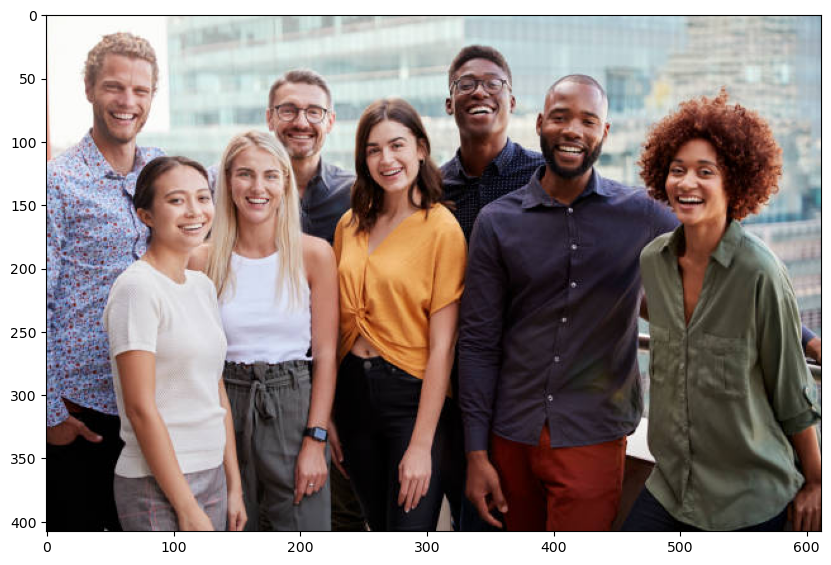

In [13]:
people_rgb = cv2.cvtColor(people, cv2.COLOR_BGR2RGB)
plt.imshow(people_rgb)

Display part of the above image corresponding to [60:250, 70:350]

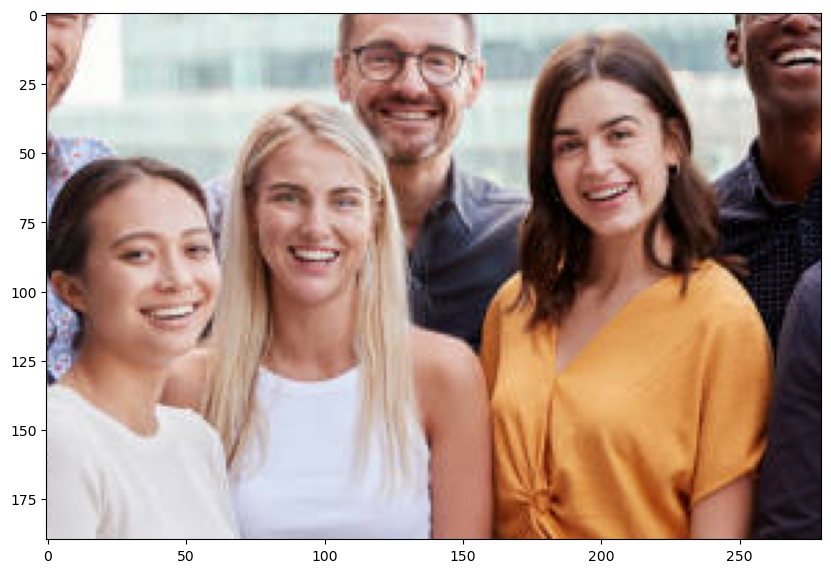

In [14]:
plt.imshow(people_rgb[60:250, 70:350])

Apply a vertical flip on the input image

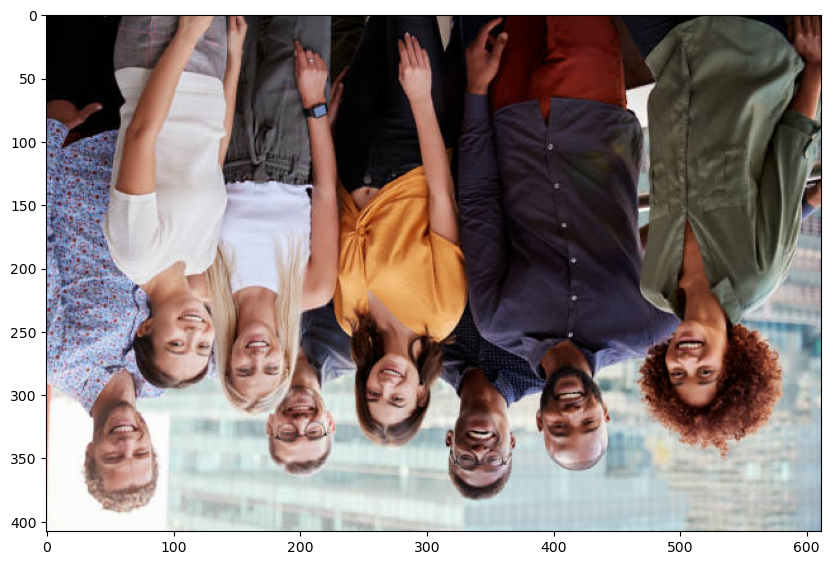

In [15]:
flip = cv2.flip(people_rgb, 0)
plt.imshow(flip)

Apply a horizontal flip on the input image

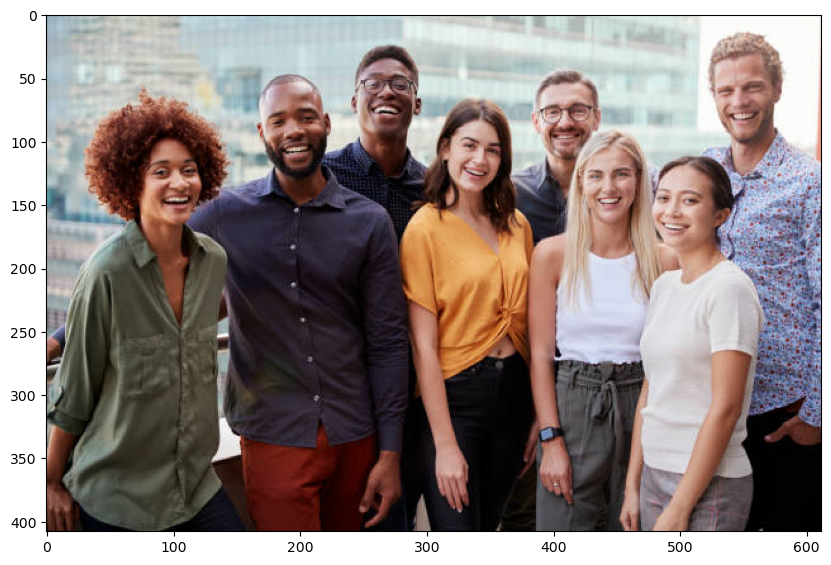

In [16]:
flip = cv2.flip(people_rgb, 1)
plt.imshow(flip)

Rotate the inout image 90 degrees counterclockwise

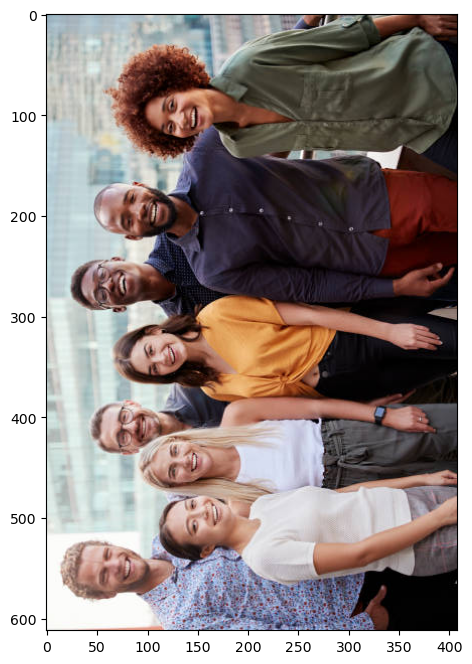

In [17]:
rotate = cv2.rotate(people_rgb, cv2.ROTATE_90_COUNTERCLOCKWISE)
plt.imshow(rotate)

Rotate input image 90 degrees clockwise

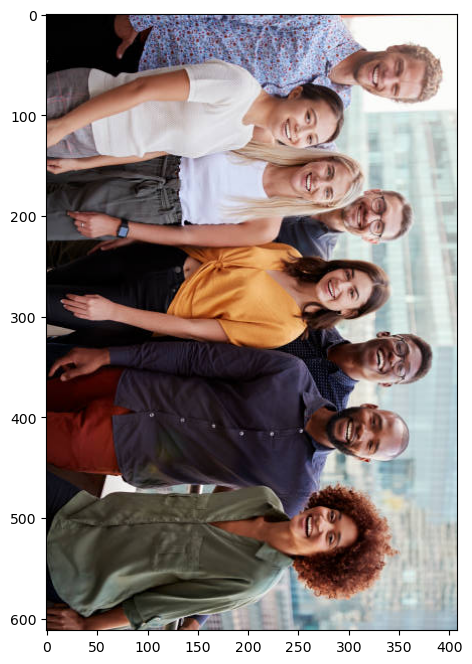

In [18]:
rotate = cv2.rotate(people_rgb, cv2.ROTATE_90_CLOCKWISE)
plt.imshow(rotate)

Create a blank image

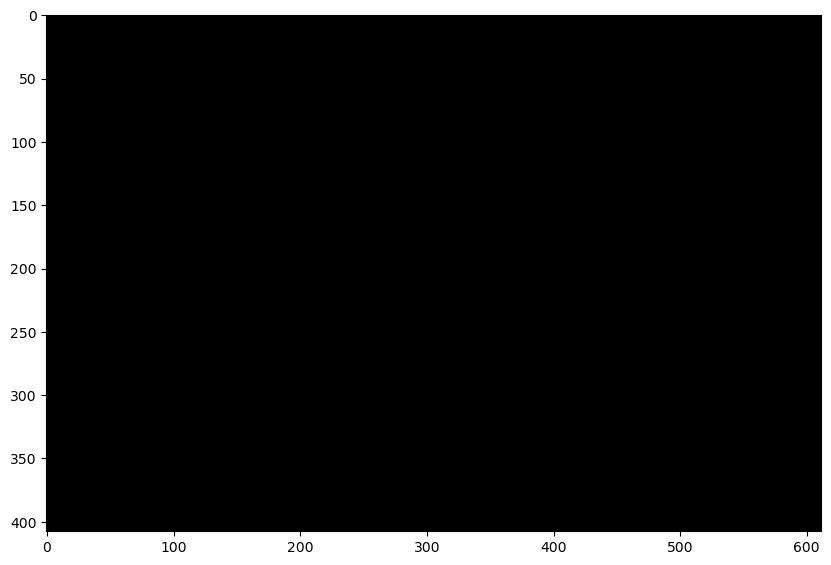

In [19]:
blank_image = np.zeros((people.shape[0], people.shape[1], 3), np.uint8)
plt.imshow(blank_image)

Create a white image

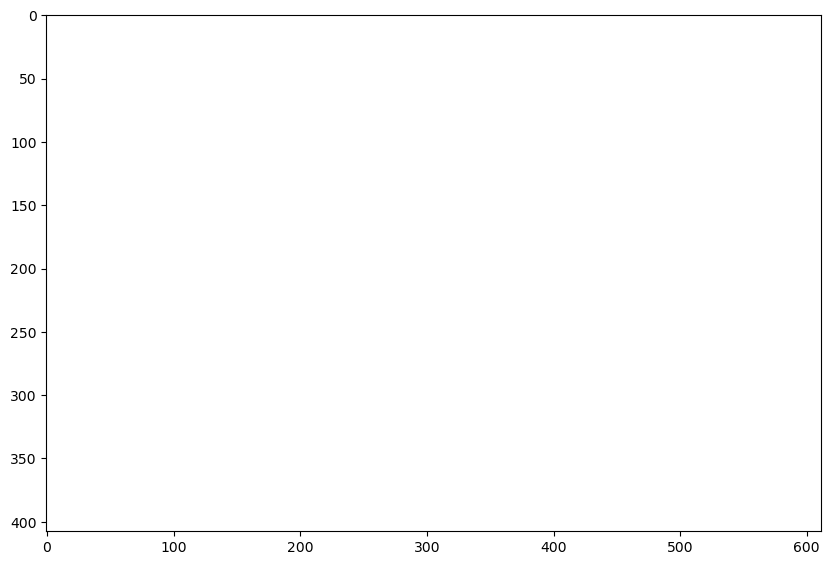

In [20]:
white_image = np.ones((people.shape[0], people.shape[1], 3), np.uint8)*255
plt.imshow(white_image)

Add a green square to the blank image at x = 240:310 and y = 60:150

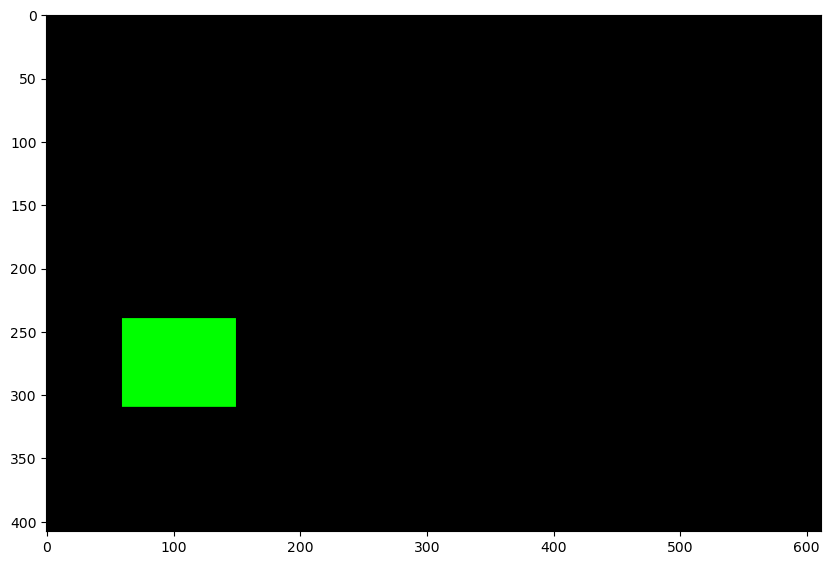

In [21]:
blank_image = np.zeros((people.shape[0], people.shape[1], 3), np.uint8)
blank_image[240:310, 60:150] = [0, 255, 0]
plt.imshow(blank_image)

Add the blank image with the green square to the input image, then correct the channels of the new image from BGR to RGB

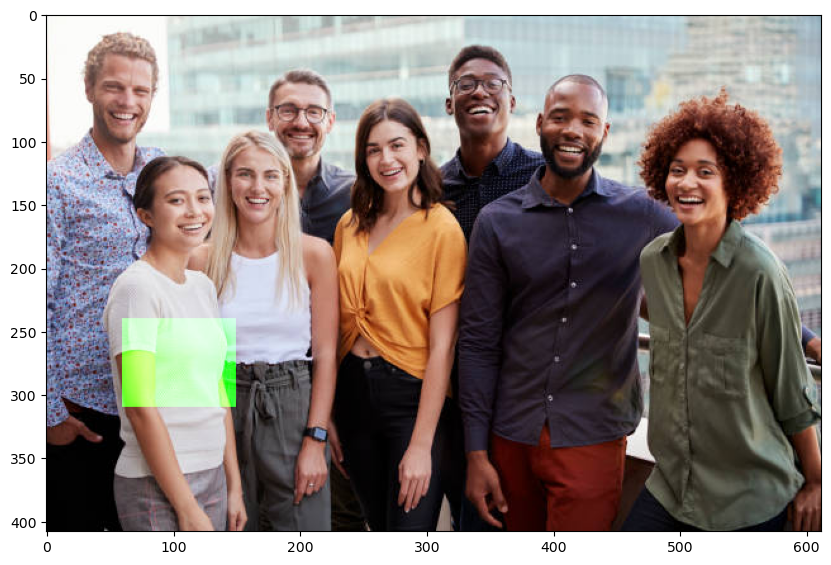

In [22]:

image = cv2.add(people_rgb, blank_image)
plt.imshow(image)

Use Gaussian Kernel Blur with a Threshold = 3 to blur the input image, then correct the channels of the new image from BGR to RGB 

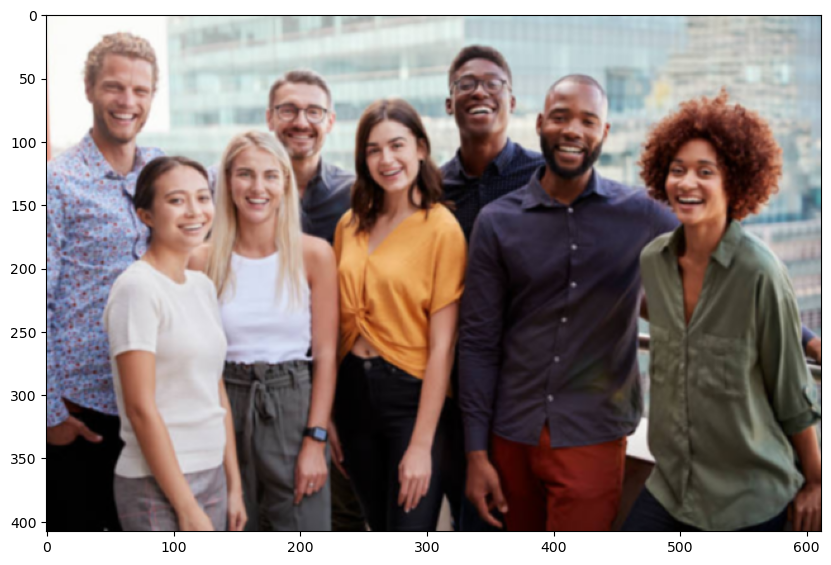

In [24]:
image = cv2.GaussianBlur(people_rgb, (3, 3),0)
plt.imshow(image)

Try different value for the threshold and analyse the differnce

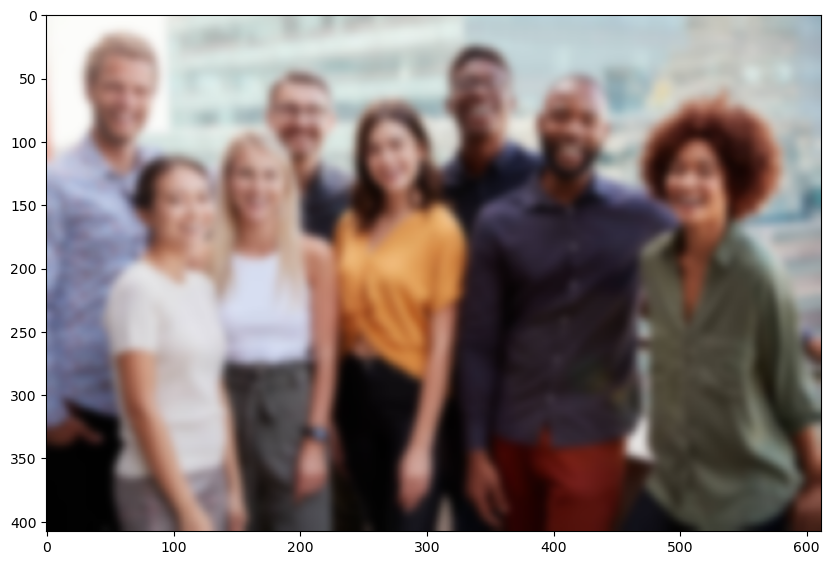

In [25]:
image = cv2.GaussianBlur(people_rgb, (21, 21),0)
plt.imshow(image)

Create a 3X3 numpy array ([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]]) then use it as a kernel "Mask" to sharpen the opencv_merged image using the cv2.filter2D method.

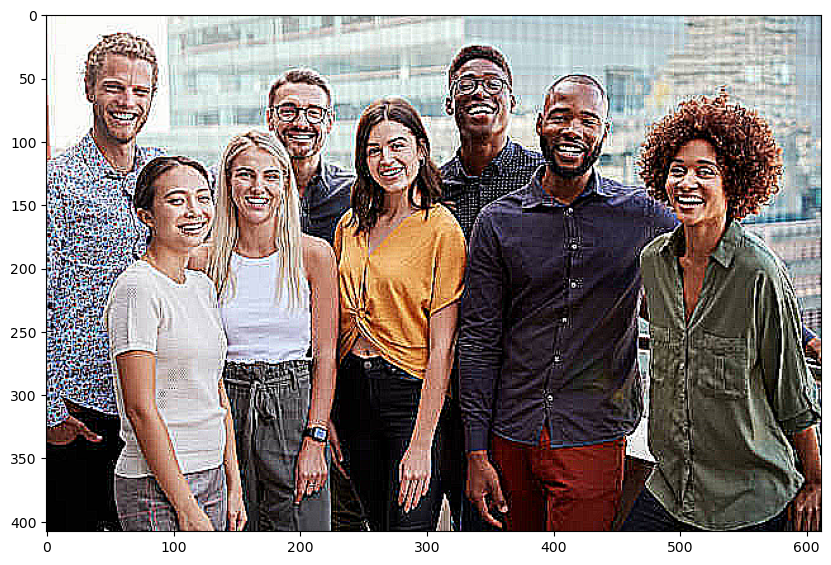

In [41]:
mask = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
sharpened = cv2.filter2D(people_rgb, -1, mask)
plt.imshow(sharpened)

Create a 3X3 numpy array ([[0, -1, 0],[-1, 5,-1], [0, -1, 0]]) then use it as a kernel "Mask" to sharpen the opencv_merged image using the cv2.filter2D method.

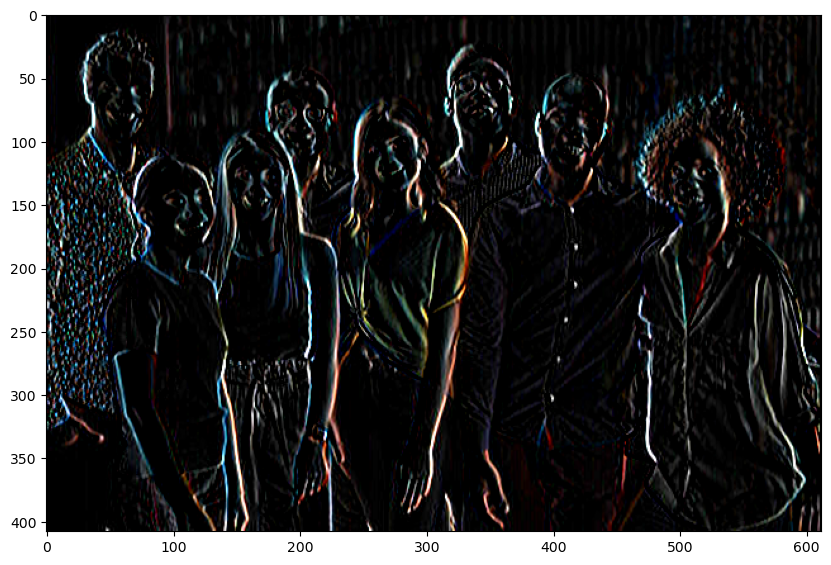

In [43]:
mask = np.array([[1, 0, -1],[1, 0,-1], [1, 0, -1]])
sharpened = cv2.filter2D(people_rgb, -1, mask)
plt.imshow(sharpened)

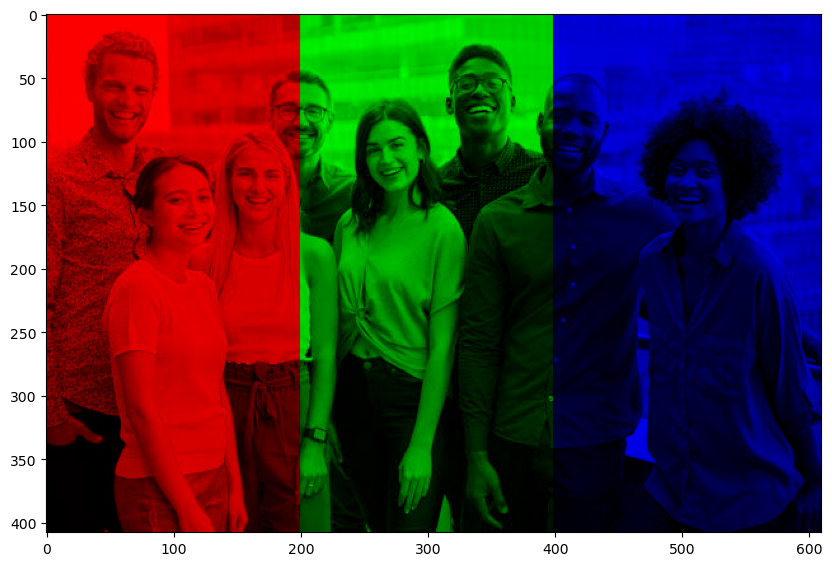

In [59]:
image1 = people_rgb[0:408, 0:200] * [1,0,0]
image2 = people_rgb[0:408, 201:400] * [0,1,0]
image3 = people_rgb[0:408, 401:612] * [0,0,1]
image = np.hstack((image1, image2, image3))
plt.imshow(image, cmap='gray')

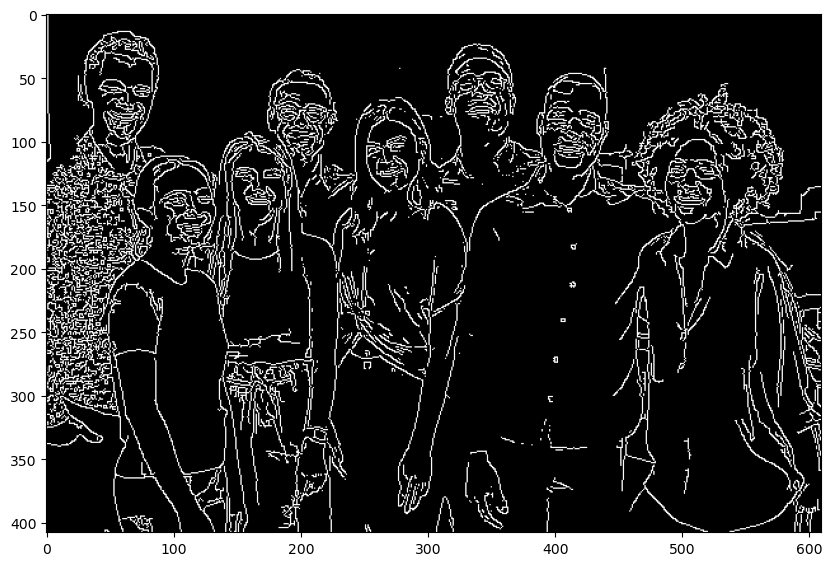

In [58]:
canny1 = cv2.Canny(people_rgb[0:408, 0:200], 0, 300)
canny2 = cv2.Canny(people_rgb[0:408, 201:400], 200, 201)
canny3 = cv2.Canny(people_rgb[0:408, 401:612], 100, 250)
canny = np.hstack((canny1, canny2, canny3))
plt.imshow(canny, cmap='gray')

## HaarCascade
**In the following exercise you will apply Haar Cascade algorithm to detect faces, eyes and smiles in an image.**

### Download Image
To complete this exercise you need to download the Day 2_Programmong Lab_Person.jpg.Make a copy of the person_image and convert it to gray.


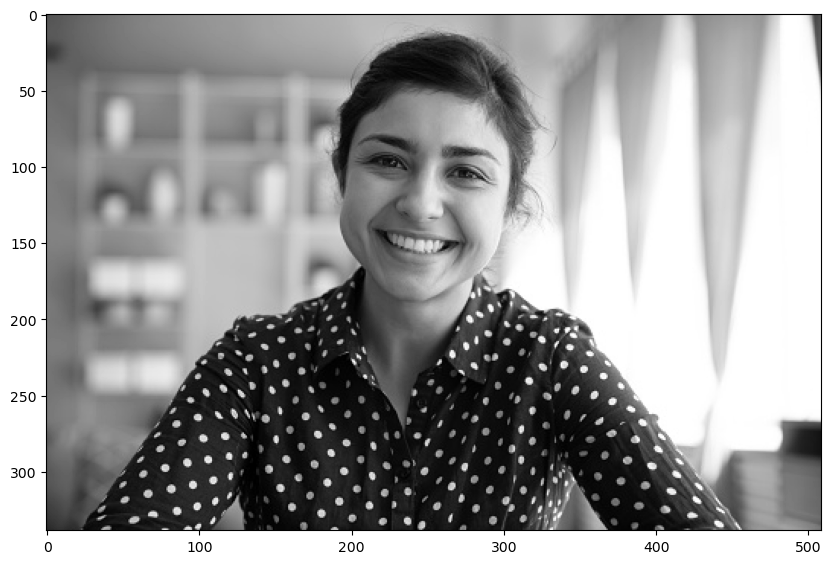

In [4]:
person = cv2.imread('Day 2_Programming Lab_Person.jpg')

person_grey = cv2.cvtColor(person, cv2.COLOR_BGR2GRAY)

plt.imshow(person_grey, cmap='gray')

Use the pre-trained model haarcascade_frontalface_default.xml to detect faces in the photo

In [169]:
def face_detect(photo, scaleFactor=1.1, minNeighbors=5, facecolor =(255,0,0), eyecolor =(0,255,0), smilecolor =(0,0,255), thickness=2):
    person_grey = cv2.cvtColor(photo, cv2.COLOR_BGR2GRAY)
    #person_grey = cv2.GaussianBlur(person_grey, (5, 5),0)
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    smile_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_smile.xml')
    eyes_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')
    faces = face_cascade.detectMultiScale(person_grey, scaleFactor=scaleFactor, minNeighbors=minNeighbors)
    max_width = 0
    max_height = 0
    for (x, y, w, h) in faces:
        cv2.rectangle(photo, (x, y), (x+w, y+h), facecolor, thickness)
        max_width = w if w > max_width else max_width
        max_height = h if h > max_height else max_height
        print(max_width)
        print(max_height)

    smile_max_width = int(max_width / 2)
    smile_max_height = int(max_height / 2)
    smile = smile_cascade.detectMultiScale(person_grey, scaleFactor=scaleFactor, minNeighbors=minNeighbors, maxSize=(smile_max_width,smile_max_height))
    for (x, y, w, h) in smile:
        cv2.rectangle(photo, (x, y), (x+w, y+h), eyecolor, thickness)

    eyes_max_width = int(max_width / 5)
    eyes_max_height = int(max_height / 5)
    eyes = eyes_cascade.detectMultiScale(person_grey, scaleFactor=scaleFactor, minNeighbors=minNeighbors, maxSize=(eyes_max_width,eyes_max_height))
    for (x, y, w, h) in eyes:
        cv2.rectangle(photo, (x, y), (x+w, y+h), smilecolor, thickness)
    
    cv2.putText(photo,'Face', (0,15), cv2.FONT_HERSHEY_PLAIN, 1, facecolor, 1)
    cv2.putText(photo,'Smile', (0,30), cv2.FONT_HERSHEY_PLAIN, 1, smilecolor, 1)
    cv2.putText(photo,'Eyes', (0,50), cv2.FONT_HERSHEY_PLAIN, 1, eyecolor, 1)

    plt.imshow(cv2.cvtColor(photo, cv2.COLOR_BGR2RGB))

In [168]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
smile_max_width = int(100 / 2)
smile_max_height = int(100 / 2)
print(smile_max_width)
print(smile_max_height)
face_cascade.detectMultiScale(person_grey, scaleFactor=1.1, minNeighbors=5, maxSize=(smile_max_width,smile_max_height))

50
50


array([[ 42,  44,  41,  41],
       [ 95, 130,  42,  42],
       [143, 111,  45,  45]], dtype=int32)

In [159]:
face_detect(cv2.imread('Day 2_Programming Lab_Person.jpg'))

137
137


error: OpenCV(4.12.0) :-1: error: (-5:Bad argument) in function 'detectMultiScale'
> Overload resolution failed:
>  - Can't parse 'maxSize'. Sequence item with index 0 has a wrong type
>  - Can't parse 'maxSize'. Sequence item with index 0 has a wrong type


Use pre-trained model haarcascade_eye.xml to detect the eyes in the photo

In [ ]:
# Please provide your solution here

Have you noticed few false positives in eye detection. How can you improve the accuracy of your model?

Have you noticed few false positives in eye detection. How can you improve the accuracy of your model

In [ ]:
#Please provide your solution here

## PIL
**In the following exercises you will use PIL library to read images and conduct image processing.**

### Download Image
To complete the following exercises you need to download the Day 2_Programming Lab_zero.jpg, Day 2_Programming Lab_one.jpg and Day 2_Programming Lab_Puppy.jpg

In [60]:
from PIL import Image
from PIL import ImageFilter
from PIL import ImageFont
from PIL import ImageDraw

In [64]:
#Please uncomment the following lines to import the required library and open the images
#from PIL import Image
img_01 = Image.open("Day 2_Programming Lab_zero.jpg")
img_02 = Image.open("Day 2_Programming Lab_one.jpg")
img_03 = Image.open("Day 2_Programming Lab_one.jpg")
img_04 = Image.open("Day 2_Programming Lab_zero.jpg")
 

Find the size of img_01, img_02, img_03 and img_04

In [66]:
print(img_01.size)
print(img_02.size)
print(img_03.size)
print(img_04.size)

(300, 300)
(300, 300)
(300, 300)
(300, 300)


In [67]:
# Run the following line to create an image 4 times the size of img_01
new_im = Image.new('RGB', (2*img_01.size[0],2*img_01.size[1]), (250,250,250))

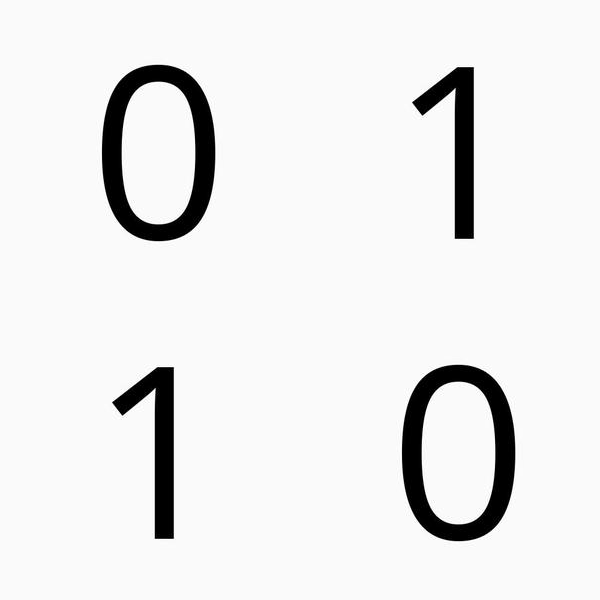

In [68]:
# Run the following code to blend all four images in one image "new_im"
new_im.paste(img_01, (0,0))
new_im.paste(img_02, (img_01.size[0],0))
new_im.paste(img_03, (0,img_01.size[1]))
new_im.paste(img_04, (img_01.size[0],img_01.size[1]))
display(new_im)

Use the .save command to save the new image as "merged_images.png"

In [69]:
new_im.save("merged_images.png")

Display the Day 2_Programming Lab_Puppy.jpg, then use image filter.GaussianBlur(4) to blur the puppy image. Use different values for the GaussianBlur and analyse the results

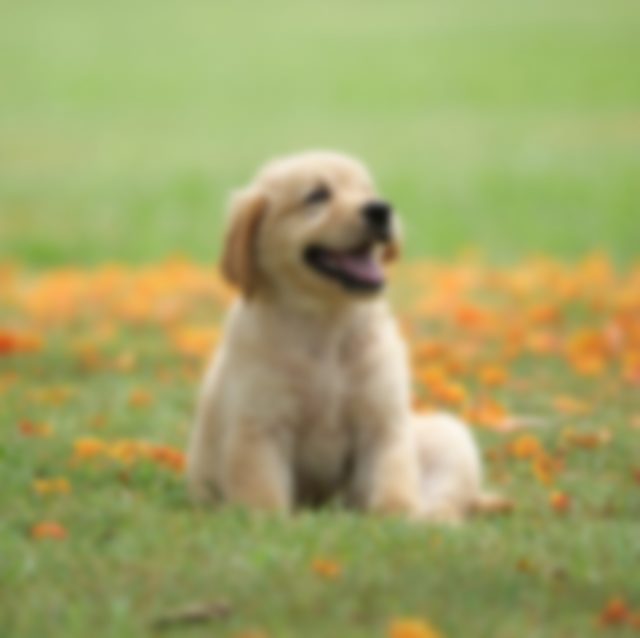

In [70]:
puppy = Image.open("Day 2_Programming Lab_puppy.jpg")
blurred = puppy.filter(ImageFilter.GaussianBlur(radius=4))
display(blurred)

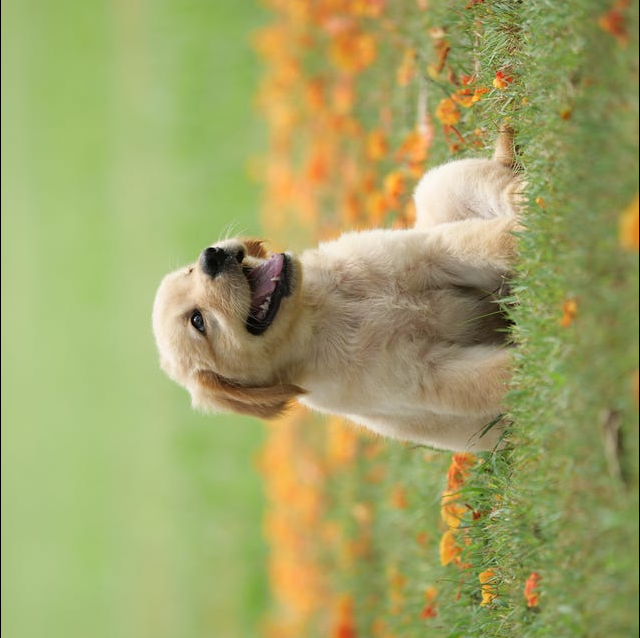

In [76]:
display(puppy.rotate(90))

Add "Python is cool" to the Day 2_Programming Lab_Puppy.jpg image

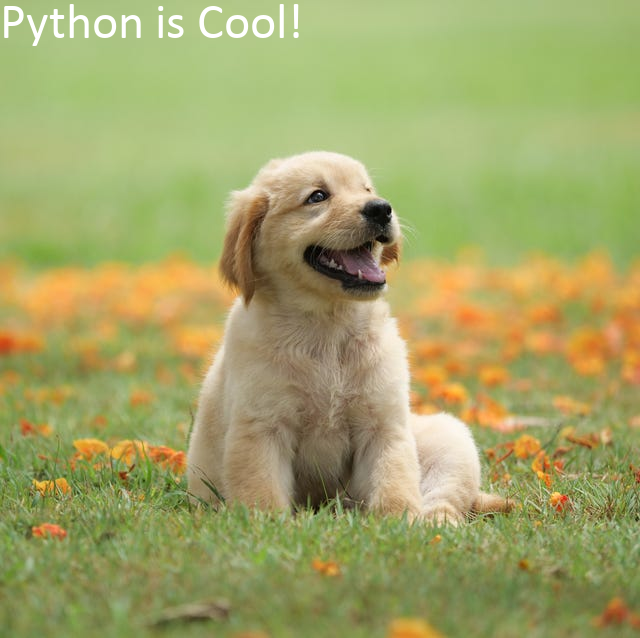

In [72]:
# Please run and analyse the following commands

image = Image.open("Day 2_Programming Lab_Puppy.jpg")
 
# creating a copy of original image
watermark_image = image.copy()
 
# Image is converted into editable form using
# Draw function and assigned to draw
draw = ImageDraw.Draw(watermark_image)
 
# ("font type",font size)
font = ImageFont.truetype("Day 2_Programming Lab_Calibri Regular.ttf", 50)
 
# Decide the text location, color and font
# (255,255,255)-White color text
draw.text((0, 0), "Python is Cool!", (255, 255, 255), font=font)

display(watermark_image)

Write the following 3 lines on the Day 2_Programming Lab_Puppy.jpg image: <br>
I <br>
Love <br> 
Python

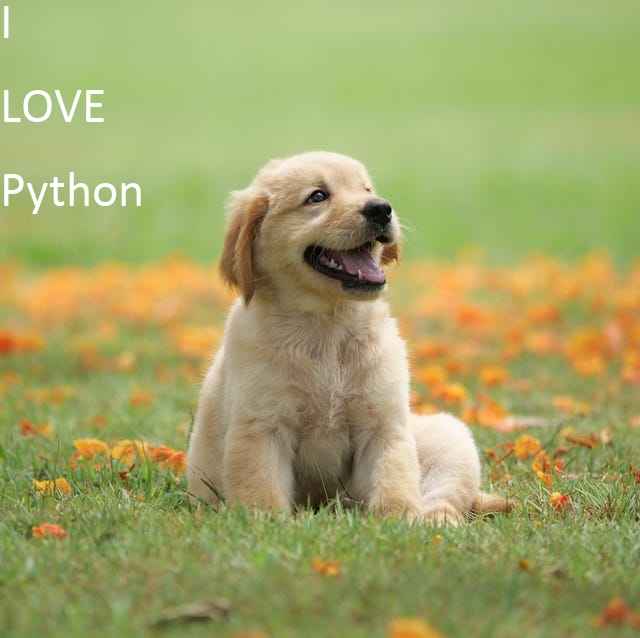

In [73]:
text = u"""\
I \n
LOVE \n 
Python"""

image = Image.open("Day 2_Programming Lab_Puppy.jpg")
 
# creating a copy of original image
watermark_image = image.copy()
 
# Image is converted into editable form using
# Draw function and assigned to draw
draw = ImageDraw.Draw(watermark_image)
 
# ("font type",font size)
font = ImageFont.truetype("Day 2_Programming Lab_Calibri Regular.ttf", 50)
 
# Decide the text location, color and font
# (255,255,255)-White color text
draw.text((0, 0), text, (255, 255, 255), font=font)

display(watermark_image)